Download Data

In [1]:
import utils

utils.download_data()
compositions, uc_params, imgdata = utils.parse_files()
SBFO_data = utils.process_data(compositions, uc_params, imgdata)

The code below displays five image acquisitions from the dataset, along with their respective histograms.

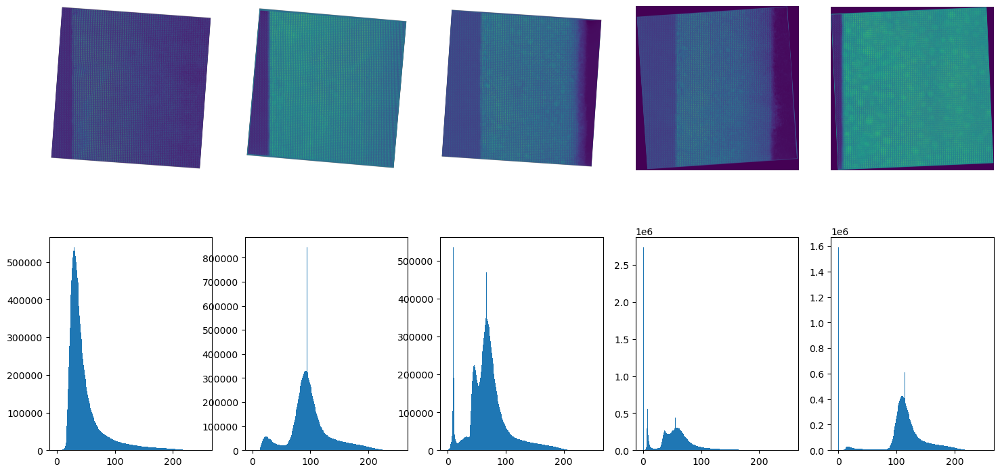

In [2]:
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path

target = Path('sample_imgs')
target.mkdir(exist_ok=True)

fig, axes = plt.subplots(2,len(SBFO_data), figsize=(18,9))
for i, (im, ax, ax2) in enumerate(zip(SBFO_data, axes[0], axes[1])):
    ax.imshow(im['image'])
    ax.set_axis_off()
    
    # Image histogram
    ax2.hist(im['image'][:].ravel(), bins=256, range=(0, 255), fc='k', ec='k')

    if not (target / f"sample_{i}.png").exists():
        img = Image.fromarray(im['image'][:])
        img = img.convert("L")  # Convert to grayscale
        img.save(target / f"sample_{i}.png")

# Data Preparation

Using cached data: True
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 45240
Number of regions with size >= 200: 233
Plotting and saving Pruned atoms: 45008
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 47120
Number of regions with size >= 200: 185
Plotting and saving Pruned atoms: 46936
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 44444
Number of regions with size >= 200: 566
Plotting and saving Pruned atoms: 43879
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask
Plotting and saving Clustered atoms: 46215
Number of regions with size >= 200: 731
Plotting and saving Pruned atoms: 45485
Plotting and saving Binary mask
Plotting and saving Eroded mask
Plotting and saving Dilated mask

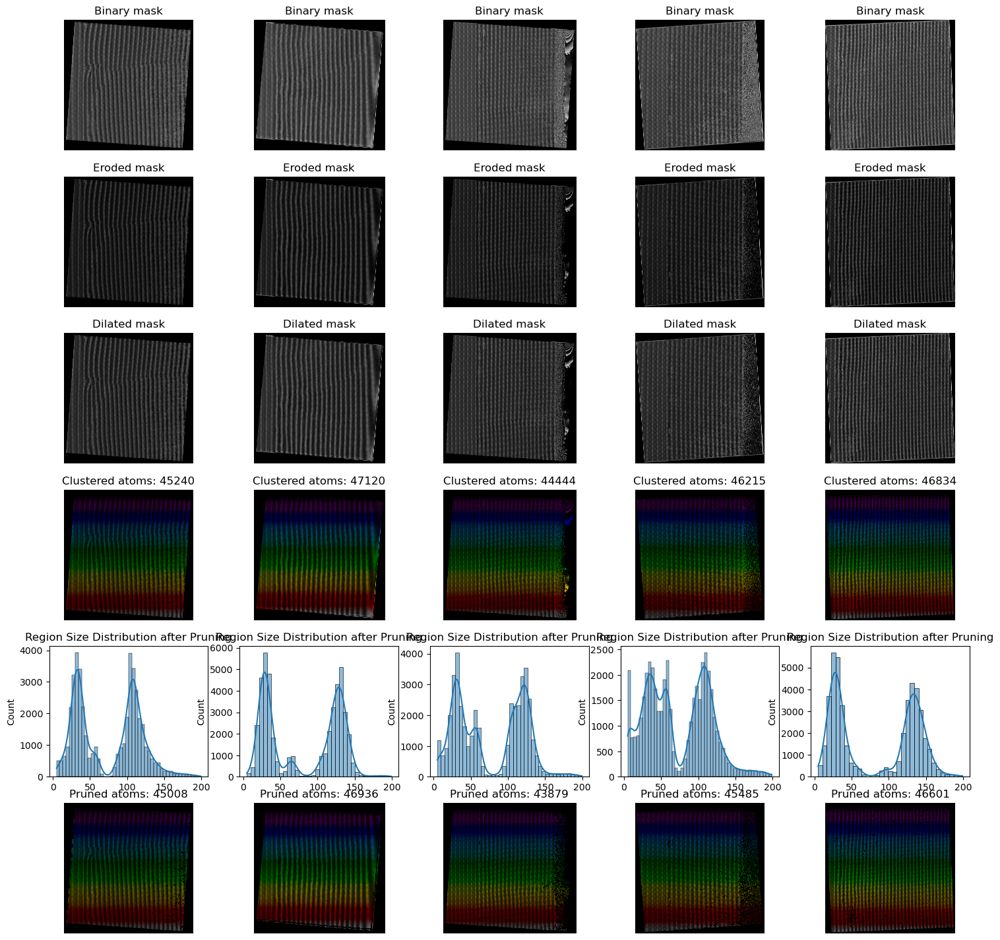

In [3]:
from pipeline import binarize, plot_and_save, find_atoms, prune_regions, find_sizes
from skimage.morphology import binary_erosion, binary_dilation, disk
import pickle
import numpy as np
import seaborn as sns
import matplotlib as mpl

cached = Path('data/processed_images.pkl').exists()
print(f"Using cached data: {cached}")
images = pickle.load(open('data/processed_images.pkl', 'rb')) if cached else {}

# We are going to store the raw image data for later use
x = []

fig, axes = plt.subplots(6,len(SBFO_data), figsize=(18,18))
for i, (im, (ax, ax2, ax3, ax4, ax5, ax6)) in enumerate(zip(SBFO_data, axes.T)):
    data = {}
    x.append(im['image'][:])

    # Binarize the image
    binary = binarize(im['image'][:]) if not cached else images[i]['binary']
    data['binary'] = binary
    plot_and_save(binary, target/f"sample_{i}_binary.png", "Binary mask", ax)

    # Erode the binary image to try and improve separation between atoms
    eroded = binary_erosion(binary, disk(2)) if not cached else images[i]['eroded']
    data['eroded'] = eroded
    plot_and_save(eroded, target/f"sample_{i}_eroded.png", "Eroded mask", ax2)
    
    # Dilate the eroded image to return atoms to original size
    dilated = binary_dilation(eroded, disk(1)) if not cached else images[i]['dilated']
    data['dilated'] = dilated
    plot_and_save(dilated, target/f"sample_{i}_dilated.png", "Dilated mask", ax3)
    
    labels = find_atoms(dilated) if not cached else images[i]['clf']
    data['clf'] = labels
    plot_and_save(labels, target/f"sample_{i}_clf.png", f"Clustered atoms: {len(np.unique(labels))}", ax4, color=True)

    # Remove classes with too many pixels
    # This is representative of regions that are too large to be atoms
    # and are likely to be noise/artifacts
    
    cutoff = 200
    sizes, class_sizes, num_greater = find_sizes(labels, cutoff=cutoff)
    print(f"Number of regions with size >= {cutoff}: {num_greater}")
    pruned_labels = prune_regions(class_sizes, labels) if not cached else images[i]['pruned']
    data['pruned'] = pruned_labels

    sns.histplot(np.array(list(class_sizes.values())), ax=ax5, kde=True)
    ax5.set_title("Region Size Distribution after Pruning")
    plot_and_save(pruned_labels, target/f"sample_{i}_clf_pruned.png", f"Pruned atoms: {len(np.unique(pruned_labels))}", ax6, color=True)
    
    if not cached:
        images[i] = data

In [4]:
if not cached:
    with open(Path('data') / "processed_images.pkl", "wb") as f:
        pickle.dump(images, f)

# Image/CNN Workflow

Print out some information about the training dataset.

In [5]:
# Sanity check
x = [np.nan_to_num(arr, nan=0) for arr in x]

In [6]:
print("Image Shapes:")
for i in range(len(x)):
    print("idx", i, len(x[i]), len(x[i][0]))

Image Shapes:
idx 0 4454 4405
idx 1 4520 4527
idx 2 4375 4443
idx 3 4397 4348
idx 4 4268 4245


Calculate some statistics about each molecule region and plot them.

Using cached data for sample 0: True


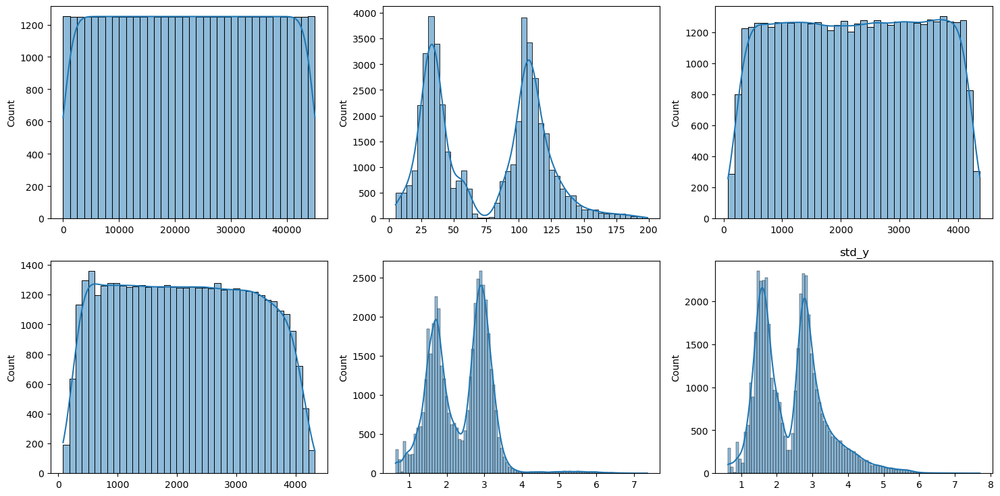

In [7]:
from pipeline import numba_class_stats
import polars as pl

samples = [0]
output_fmt = 'data/stats_df_{sample}.parquet'
class_features = {}

figures = []
for sample in samples:
    output = Path(output_fmt.format(sample=sample))
    cached = output.exists()
    print(f"Using cached data for sample {sample}: {cached}")
    class_data = numba_class_stats(images[0]['pruned']) if not cached else pl.read_parquet(output)
    class_features[sample] = class_data
    if not cached:
        class_data.to_parquet(output)
    fig, axes = plt.subplots(2, len(class_data.columns)//2, figsize=(18, 9))
    for i, (col, ax) in enumerate(zip(class_data.columns, axes.flatten())):
        sns.histplot(class_data[col], ax=ax, kde=True)
    ax.set_title(col)
    figures.append(fig)

Visualization of stdv in x and y directions.

/tmp/ipykernel_110886/4027860058.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


<Axes: xlabel='std_x', ylabel='std_y'>

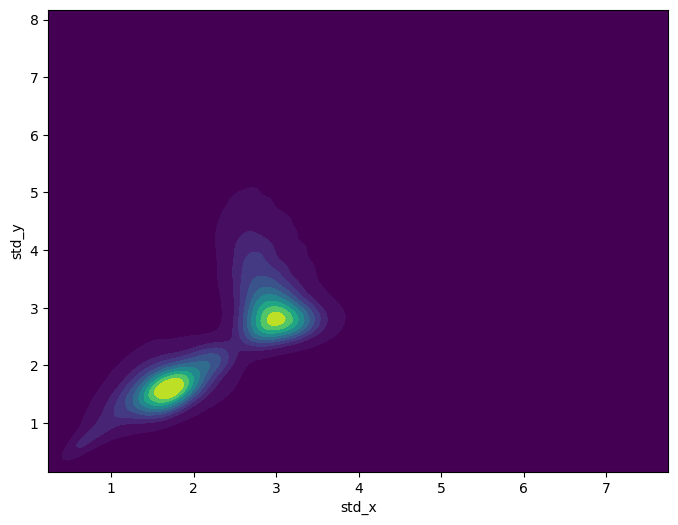

In [8]:
from matplotlib.colors import to_rgba
import matplotlib.cm as cm

cmap = cm.get_cmap('viridis')
background_color = to_rgba(cmap(0))

fig, ax = plt.subplots(figsize=(8, 6))

# Draw a rectangle to fill the entire axes background
ax.add_patch(plt.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                           color=background_color, zorder=0))
sns.kdeplot(data=class_data, x='std_x', y='std_y', fill=True, cmap='viridis')

/tmp/ipykernel_110886/4027860058.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('viridis')


<Axes: xlabel='std_x', ylabel='std_y'>

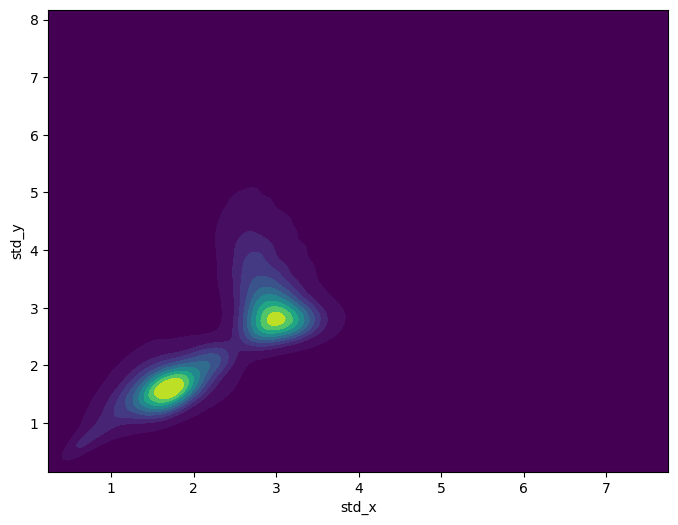

In [9]:
from matplotlib.colors import to_rgba
import matplotlib.cm as cm

cmap = cm.get_cmap('viridis')
background_color = to_rgba(cmap(0))

fig, ax = plt.subplots(figsize=(8, 6))

# Draw a rectangle to fill the entire axes background
ax.add_patch(plt.Rectangle((0, 0), 1, 1, transform=ax.transAxes,
                           color=background_color, zorder=0))
sns.kdeplot(data=class_data, x='std_x', y='std_y', fill=True, cmap='viridis')

Classify molecules based on the statistics. In this case, there are 2 kinds, samarium and bismuth ferrite. We will use a gmm to classify each region and then reassemble the image using the newly learned labels.

/home/alexk101/Documents/Research/phd/projects/micrography/pipeline.py:165: NumbaTypeSafetyWarning: unsafe cast from int64 to uint32. Precision may be lost.
  class_map[0] = 0


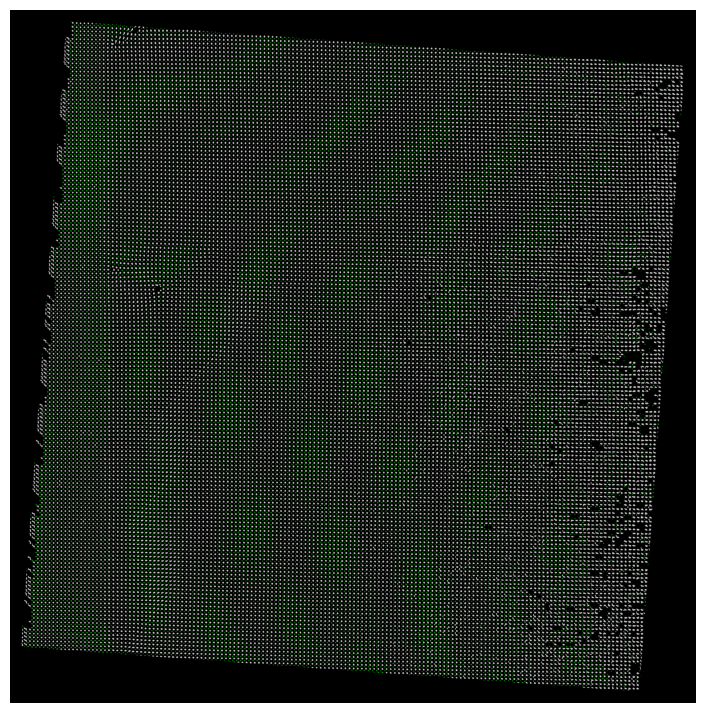

In [10]:
from sklearn.mixture import GaussianMixture
from pipeline import reassign_classes

# We will use these labels to classify the atoms
y = []

for sample in samples:
    # Features to use for clustering
    feats = ['std_x', 'std_y', 'size']

    # Classify molecules using Gaussian Mixture Model
    y_pred = GaussianMixture(n_components=2, random_state=42).fit_predict(class_data[feats]) + 1
    org_img = images[sample]['pruned'].astype(np.uint32)
    org_classes = class_data['class'].to_numpy()

    # Apply new labels to image
    new_labels = reassign_classes(
        org_img, 
        org_classes, 
        y_pred
    )
    y.append(new_labels)

    # Plotting
    fig, ax = plt.subplots(1, 1, figsize=(9, 9))
    ax.imshow(new_labels, cmap='nipy_spectral')
    ax.set_axis_off()

    cm = mpl.cm.nipy_spectral(np.linspace(0, 1, len(np.unique(new_labels))))
    colored_new_labels = np.array([cm[label] for label in new_labels])
    colored_new_labels = (colored_new_labels * 255).astype(np.uint8)  # Convert to uint8

    img = Image.fromarray(colored_new_labels)
    img.save(target/f"sample_{samples}_gmm.png")

In [11]:
print("Label Shapes:")
for i in range(len(y)):
    print("idx", i, len(y[i]), len(y[i][0]))

Label Shapes:
idx 0 4454 4405


In [12]:
def extract_windows(x, y, window_size, stride):
    # Initialize lists to hold the windows
    windows_x = []
    windows_y = []
    
    # Loop over each image in x and corresponding label in y
    for img, label in zip(x, y):
        height, width = img.shape
        
        # Calculate the number of windows in height and width
        num_windows_x = (height - window_size) // stride + 1
        num_windows_y = (width - window_size) // stride + 1
        
        # Slide over the image and label to extract windows
        for i in range(num_windows_x):
            for j in range(num_windows_y):
                start_i = i * stride
                start_j = j * stride
                
                window_x = img[start_i:start_i+window_size, start_j:start_j+window_size]  # Extract window from image
                window_y = label[start_i:start_i+window_size, start_j:start_j+window_size]  # Extract window from label
                
                # Append to the list of windows
                windows_x.append(window_x)
                windows_y.append(window_y)
    
    # Convert lists to numpy arrays
    windows_x = np.array(windows_x)
    windows_y = np.array(windows_y)
    
    return windows_x, windows_y

#Needs a lot of memory, adjust stride/window size to conserve

stride = 16
window_size = 32  # N
windows_x, windows_y = extract_windows(x, y, window_size, stride)

print("Dataset Size:", len(windows_x))

Dataset Size: 75898


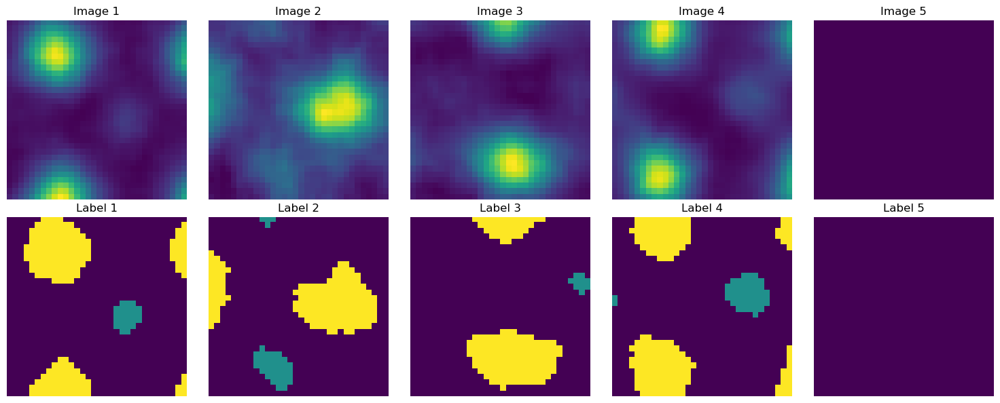

In [13]:
num_samples = 5
random_indices = np.random.choice(len(windows_x), num_samples, replace=False)

fig, axes = plt.subplots(2, num_samples, figsize=(15, 6))
for i, idx in enumerate(random_indices):
    # Image window
    axes[0, i].imshow(windows_x[idx], cmap='viridis')
    axes[0, i].set_title(f"Image {i+1}")
    axes[0, i].axis('off')
    
    # Label window
    axes[1, i].imshow(windows_y[idx])
    axes[1, i].set_title(f"Label {i+1}")
    axes[1, i].axis('off')

plt.tight_layout()
plt.show()

Define our model

In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
import matplotlib.pyplot as plt
from autoencoder import Autoencoder

# Use high performance matrix multiplication if available
torch.set_float32_matmul_precision('high')

# Dataset
x_tensor = torch.tensor(windows_x, dtype=torch.float32)  # Shape: (N, 1, 32, 32)
y_tensor = torch.tensor(windows_y, dtype=torch.long)  # Shape: (N, 1)

dataset = TensorDataset(x_tensor, y_tensor)
dataloader = DataLoader(dataset, batch_size=64, shuffle=True)

# Model initialization
num_classes =  3 # Change this to match your number of classes
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

latent_dim = 64
model = Autoencoder(num_classes, latent_dim).to(device)
model.compile()  # Compile the model for better performance

# Loss function and optimizer
criterion = nn.CrossEntropyLoss()  # Suitable for multiclass classification
optimizer = optim.AdamW(model.parameters(), lr=0.001, weight_decay=1e-4, fused=True)

Using device: cuda


Epoch [1/20] | Loss: 0.1968 | Accuracy: 0.9537 | LR: 0.000400
Epoch [2/20] | Loss: 0.1116 | Accuracy: 0.9578 | LR: 0.000400
Epoch [3/20] | Loss: 0.1052 | Accuracy: 0.9597 | LR: 0.000400
Epoch [4/20] | Loss: 0.1015 | Accuracy: 0.9607 | LR: 0.000400
Epoch [5/20] | Loss: 0.0983 | Accuracy: 0.9618 | LR: 0.000400
Epoch [6/20] | Loss: 0.0954 | Accuracy: 0.9630 | LR: 0.000400
Epoch [7/20] | Loss: 0.0931 | Accuracy: 0.9638 | LR: 0.000400
Epoch [8/20] | Loss: 0.0910 | Accuracy: 0.9648 | LR: 0.000400
Epoch [9/20] | Loss: 0.0888 | Accuracy: 0.9655 | LR: 0.000400
Epoch [10/20] | Loss: 0.0868 | Accuracy: 0.9664 | LR: 0.000400
Epoch [11/20] | Loss: 0.0849 | Accuracy: 0.9671 | LR: 0.000400
Epoch [12/20] | Loss: 0.0831 | Accuracy: 0.9673 | LR: 0.000400
Epoch [13/20] | Loss: 0.0818 | Accuracy: 0.9680 | LR: 0.000400
Epoch [14/20] | Loss: 0.0806 | Accuracy: 0.9683 | LR: 0.000400
Epoch [15/20] | Loss: 0.0795 | Accuracy: 0.9688 | LR: 0.000400
Epoch [16/20] | Loss: 0.0785 | Accuracy: 0.9691 | LR: 0.000400
E

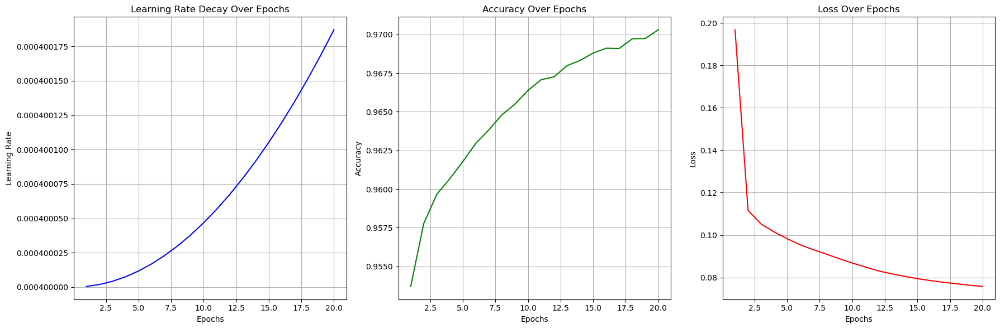

In [15]:
from autoencoder import train, compute_accuracy
# Training loop
epochs = 20
# Learning rate scheduler
scheduler = optim.lr_scheduler.OneCycleLR(
    optimizer, max_lr=0.01, steps_per_epoch=len(dataloader), epochs=epochs
)

# Mixed precision scaler
scaler = torch.amp.GradScaler(device)
learning_rates = []
losses = []
accuracies = []

for epoch in range(epochs):
    train_loss = train(model, dataloader, criterion, optimizer, scaler, device)
    scheduler.step()
    current_lr = optimizer.param_groups[0]['lr']
    accuracy = compute_accuracy(model, dataloader, device)

    print(f"Epoch [{epoch+1}/{epochs}] | Loss: {train_loss:.4f} | Accuracy: {accuracy:.4f} | LR: {current_lr:.6f}")
    learning_rates.append(current_lr)
    losses.append(train_loss)
    accuracies.append(accuracy)

# Plotting results
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Learning Rate
ax[0].plot(range(1, epochs + 1), learning_rates, color='blue')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Learning Rate')
ax[0].set_title('Learning Rate Decay Over Epochs')
ax[0].grid(True)

# Accuracy
ax[1].plot(range(1, epochs + 1), accuracies, color='green')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Accuracy')
ax[1].set_title('Accuracy Over Epochs')
ax[1].grid(True)

# Loss
ax[2].plot(range(1, epochs + 1), losses, color='red')
ax[2].set_xlabel('Epochs')
ax[2].set_ylabel('Loss')
ax[2].set_title('Loss Over Epochs')
ax[2].grid(True)

plt.tight_layout()
plt.show()

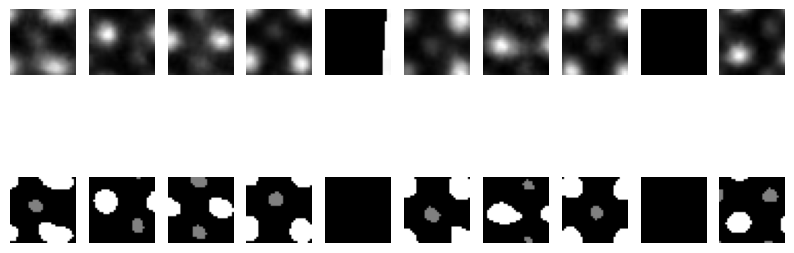

In [16]:
# Visualize original and reconstructed images
model.eval()
with torch.no_grad():
    sample, _ = next(iter(dataloader))
    sample = sample.to(device)
    outputs = model(sample)

    # If the output is multi-class (num_classes > 1), take the class with the highest logit
    if outputs.dim() == 4:  # Shape is (batch_size, num_classes, height, width)
        # Get the class with the highest logit for each pixel
        _, predicted = torch.max(outputs, 1)  # Predicted shape: (batch_size, height, width)
        predicted = predicted.unsqueeze(1)  # Add channel dimension for visualization
    else:
        predicted = outputs

    # Plot original and reconstructed images
    fig, axes = plt.subplots(2, 10, figsize=(10, 4))
    for i in range(10):
        axes[0, i].imshow(sample[i].cpu().squeeze(), cmap="gray")
        axes[0, i].axis("off")
        axes[1, i].imshow(predicted[i].cpu().squeeze(), cmap="gray")
        axes[1, i].axis("off")
    plt.show()

Visualize the latent distribution of the model

In [17]:
# from autoencoder import visualize_latent_dist

# visualize_latent_dist(model, device, dataloader)

Visualize the latent representation of the model

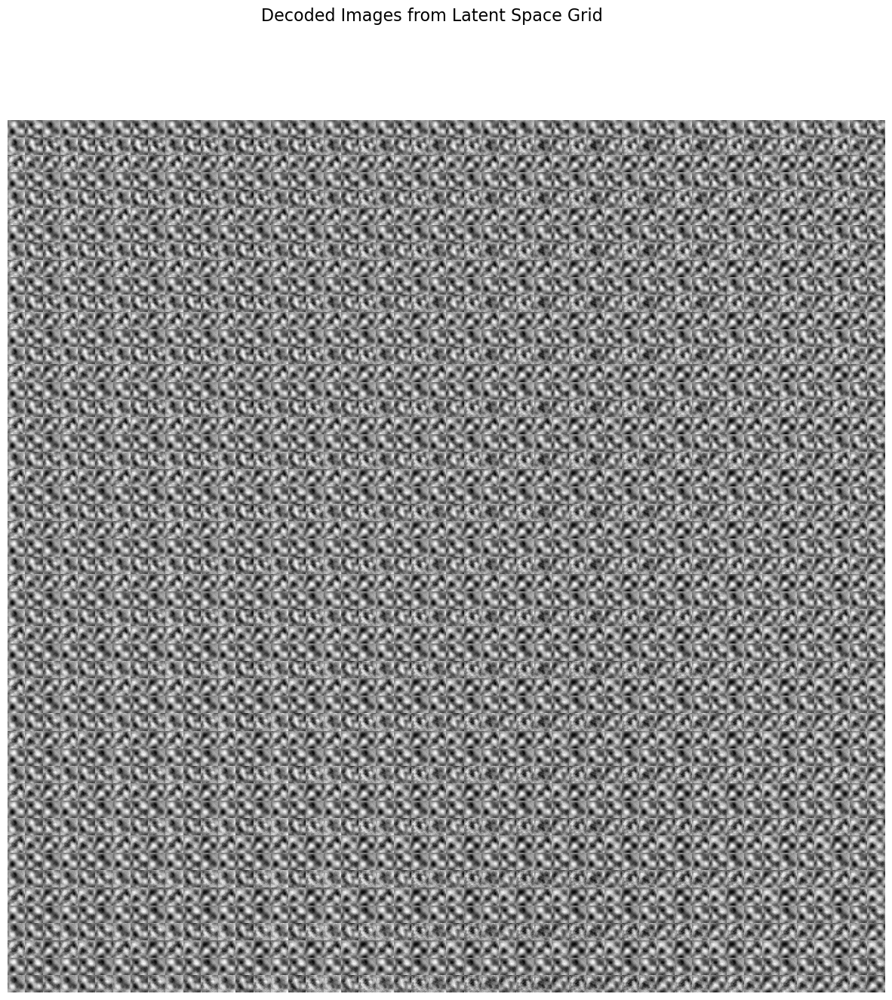

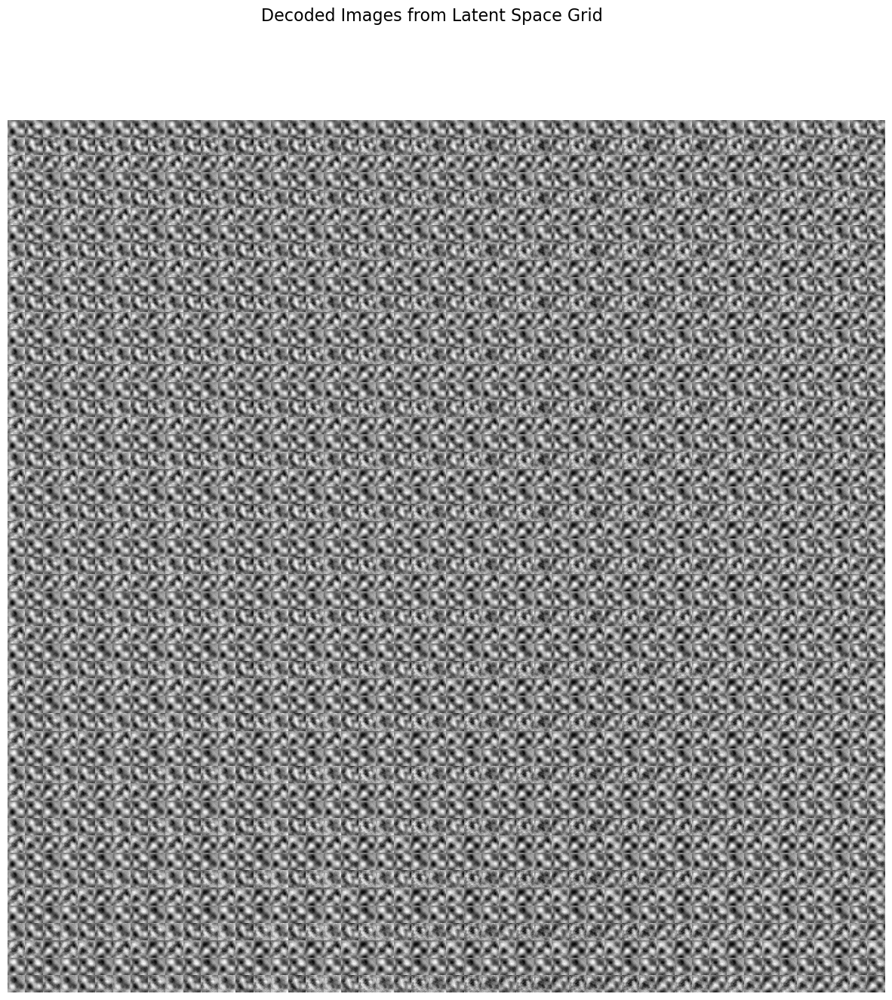

In [18]:
from autoencoder import visualize_latent_space

visualize_latent_space(model, device, latent_dim, grid_size=50, latent_range=(-3, 3), image_size=(32, 32))

# Graph Workflow

In [19]:
from pipeline import get_nearest_neighbors
# Calculate nearest neighbor distances of 4 nearest neighbors
# The data consists of a 2d array where the non-zero values are the regions
# The distance should be the euclidean distance between the centroids of the regions
# The output should be a 2d array of shape (n, 4) where n is the number of regions
# The output should be the distances and the indices of the nearest neighbors

all_neighbors = {}
for sample in samples:
    centroids = np.array(
        [
            class_features[sample]['median_x'].to_numpy(), 
            class_features[sample]['median_y'].to_numpy()
        ]
    ).T
    dists, indices = get_nearest_neighbors(centroids)
    all_neighbors[sample] = (dists, indices)

{'centroid': array([ 75, 391], dtype=uint32), 'size': 10}


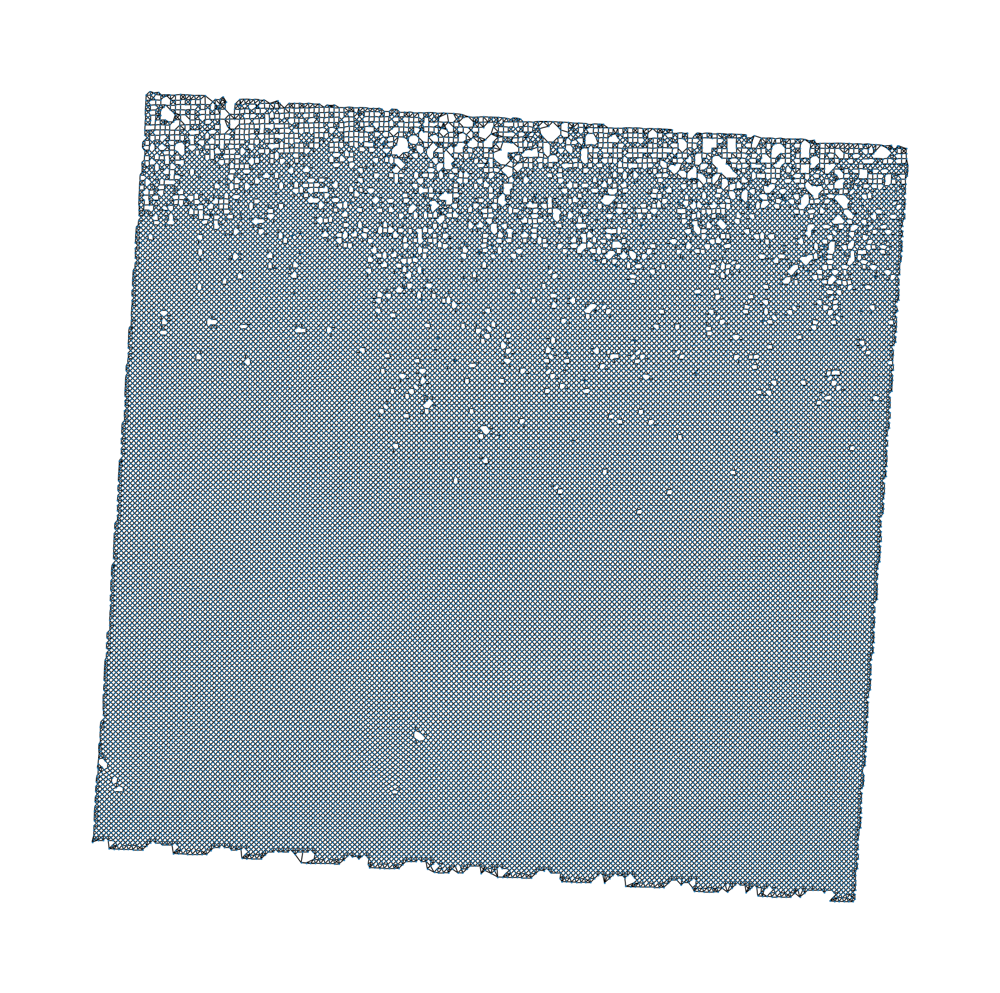

In [20]:
# Construct a graph of the regions where the nodes are the regions and the edges are the nearest neighbors
# The graph should be represented as a networkx graph, where the nodes are the region indices and the edges are the distances
# The graph should be undirected and the nodes should contain the centroid coordinates
from networkx import Graph
import networkx as nx

def construct_graph(dists, indices, centroids):
    G = Graph()
    for i, (dist, idx) in enumerate(zip(dists, indices)):
        for d, j in zip(dist, idx):
            G.add_edge(i, j, weight=d)
        G.nodes[i]['centroid'] = centroids[i]
        G.nodes[i]['size'] = class_data['size'][i]
    return G

dists, indices = all_neighbors[0]
G = construct_graph(dists, indices, centroids)
print(G.nodes[0])

# Plot the graph with the nodes colored by the region size
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_size=1, ax=ax)
plt.show()

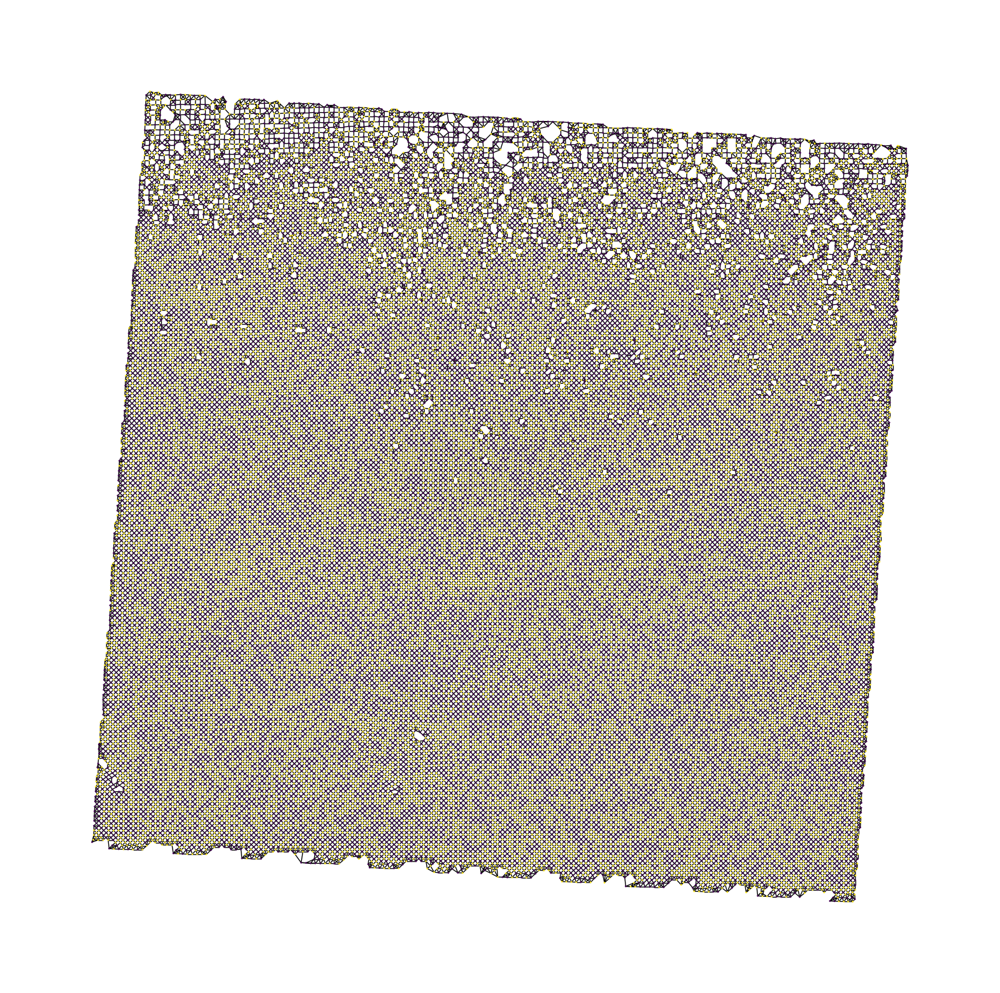

In [21]:
# Plot the graph colored by the new classes
G = construct_graph(dists, indices, centroids)
fig, ax = plt.subplots(figsize=(20, 20))
pos = {i: G.nodes[i]['centroid'] for i in G.nodes}
nx.draw(G, pos, node_color=y_pred, node_size=1, ax=ax)
plt.show()